In [1]:
!pip install diffusers
!pip install sentence-transformers
!pip install torch
!pip install pot

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install opencv-python


Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
!pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
!pip install accelerate

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
!pip install tf-keras

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
!pip install gensim

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
!pip install ipywidgets --upgrade

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [8]:
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118

Defaulting to user installation because normal site-packages is not writeable
Looking in indexes: https://download.pytorch.org/whl/cu118



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [9]:
import torch
print(torch.cuda.is_available())  
print(torch.version.cuda)  

True
11.8


In [10]:
from diffusers import DiffusionPipeline, StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests
from io import BytesIO
import time
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

from sentence_transformers import SentenceTransformer

import os

from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
from IPython.display import display, Image as Image2
import sys
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
import cv2
from sklearn.decomposition import TruncatedSVD

from sklearn.linear_model import LinearRegression
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt
from matplotlib import transforms
import torch
import os
from sklearn.metrics import mean_absolute_error, mean_squared_error
from sklearn.linear_model import Lasso
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import Ridge
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from itertools import chain, combinations
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from scipy.stats import wasserstein_distance
from gensim.models import KeyedVectors
from gensim.downloader import load as api_load
from gensim.models import KeyedVectors
from sklearn.metrics.pairwise import euclidean_distances
from scipy.spatial.distance import cdist
from transformers import AutoTokenizer, AutoModel
import torch
import tensorflow as tf
from gensim.models import KeyedVectors
from torch import Generator
import warnings
warnings.filterwarnings('ignore')


In [11]:
import torch
torch.cuda.empty_cache()

In [12]:
#Instruct PIX2PIX
# Initialize the model and pipeline
model_name = "timbrooks/instruct-pix2pix"
pipe = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_name, torch_dtype=torch.float16, force_download=True)
device = "cuda"
pipe.to(device)

model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionInstructPix2PixPipeline {
  "_class_name": "StableDiffusionInstructPix2PixPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "timbrooks/instruct-pix2pix",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": false,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "EulerAncestralDiscreteScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [13]:
#Dinov2
processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
model = AutoModel.from_pretrained("facebook/dinov2-base")
#Word2Vec model
model_path_bin = r'D:\New folder (2)\GoogleNews-vectors-negative300.bin'
model_txt = KeyedVectors.load_word2vec_format(model_path_bin, binary=True)


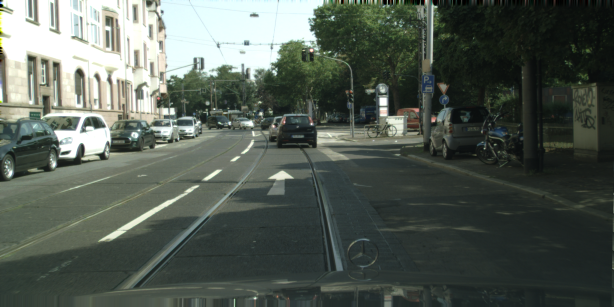

In [14]:
# Load the initial image
url = r"D:\New folder (2)\resize30%\1(1).png"
init_image = Image.open(url)
display(init_image)


In [15]:
cfg_image = 7.5 # This controls how much the output should resemble the original image
cfg_text = 1.5 # This controls how much the output should follow the text prompt

In [16]:
prompt = "transform this image to be evening ###"
words = prompt.split()
words

['transform', 'this', 'image', 'to', 'be', 'evening', '###']

In [17]:
def extract_image_embedding(image, processor, model):
    """Extract embeddings from an image using the DINOv2 model."""
    inputs = processor(images=image, return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    embeddings = outputs.last_hidden_state.mean(dim=1).squeeze().cpu().numpy()
    return embeddings

# Set initial Wasserstein distance to a large number
WD_dist_init = float('inf')

# Path to save generated images on your local system
output_path = "D:\\snowstr\\orig.png"


# Repeat generation process until Wasserstein distance is less than 0.1
while WD_dist_init > 0.07:
    # Generate the image
    orig_image = pipe(
        prompt=prompt, 
        image=init_image, 
        cfg_image=cfg_image, 
        cfg_text=cfg_text).images[0]
    
    # Extract embeddings for the original image and initial image
    orig_embedding = extract_image_embedding(orig_image, processor, model)
    init_embedding = extract_image_embedding(init_image, processor, model)
    
    # Calculate Wasserstein distance between the embeddings
    WD_dist_init = wasserstein_distance(orig_embedding, init_embedding)

    print(f'Wasserstein distance: {WD_dist_init}')

    # Save and display the image only if the distance is acceptable
    if WD_dist_init <= 0.07:
        # Save the generated image to the local path
        orig_image.save(output_path)
        print(f"Image saved at: {output_path}")
        
        # Display the image if you're working in an environment where you can visualize it
        # You might need to remove this in VSCode, or use an external viewer
        orig_image.show()

print("Image generation complete with acceptable Wasserstein distance!")


  0%|          | 0/100 [00:00<?, ?it/s]

Wasserstein distance: 0.03372134704704876
Image saved at: D:\snowstr\orig.png
Image generation complete with acceptable Wasserstein distance!


Perturbation: (0, 0, 0, 1, 1, 0, 1), Perturbed Text: to be ###
Perturbation: (1, 1, 0, 1, 0, 1, 0), Perturbed Text: to this transform evening
Perturbation: (1, 0, 1, 1, 1, 0, 1), Perturbed Text: be transform ### to image
Perturbation: (0, 1, 1, 0, 1, 1, 1), Perturbed Text: evening be this ### image
Perturbation: (0, 0, 1, 0, 0, 0, 0), Perturbed Text: evening image
Perturbation: (1, 1, 1, 1, 1, 0, 0), Perturbed Text: be this transform to image
Perturbation: (1, 0, 0, 0, 1, 0, 1), Perturbed Text: be transform ###
Perturbation: (0, 0, 0, 1, 1, 1, 0), Perturbed Text: to be evening
Perturbation: (0, 1, 1, 1, 1, 0, 1), Perturbed Text: be this ### to image
Perturbation: (1, 1, 0, 0, 0, 1, 1), Perturbed Text: this transform ### evening
Perturbation: (0, 1, 0, 0, 0, 1, 1), Perturbed Text: this ### evening
Perturbation: (0, 0, 0, 0, 0, 0, 1), Perturbed Text: be ### image
Perturbation: (1, 0, 0, 0, 0, 1, 1), Perturbed Text: evening transform ###
Perturbation: (0, 0, 1, 0, 0, 1, 0), Perturbed Text

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 1:
Wasserstein distance (generated vs init): 0.02697569496634364
Wasserstein distance (generated vs orig): 0.007730427839135249


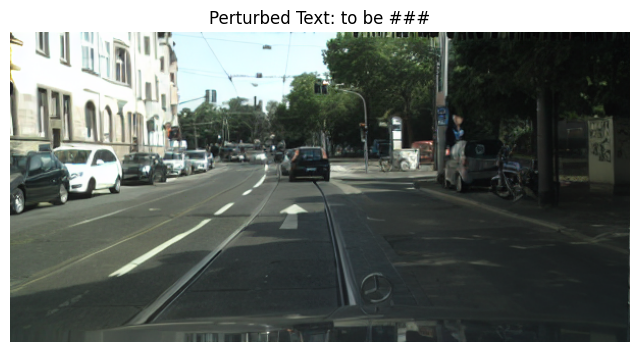

Image generation 1 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 2:
Wasserstein distance (generated vs init): 0.03593665573976067
Wasserstein distance (generated vs orig): 0.017065665665162072


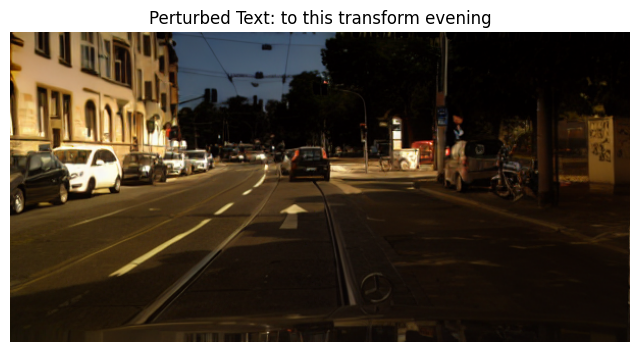

Image generation 2 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 3:
Wasserstein distance (generated vs init): 0.026441655006692613
Wasserstein distance (generated vs orig): 0.008534807763216658


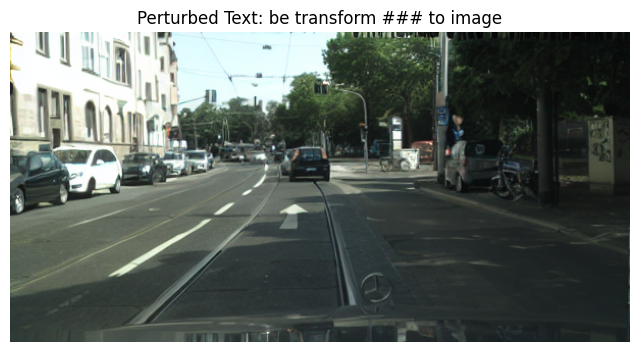

Image generation 3 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 4:
Wasserstein distance (generated vs init): 0.024178049008848283
Wasserstein distance (generated vs orig): 0.0335442341228524


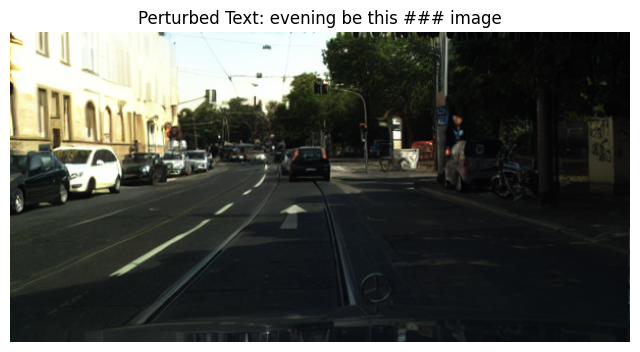

Image generation 4 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 5:
Wasserstein distance (generated vs init): 0.02532871080446361
Wasserstein distance (generated vs orig): 0.006907019324065304


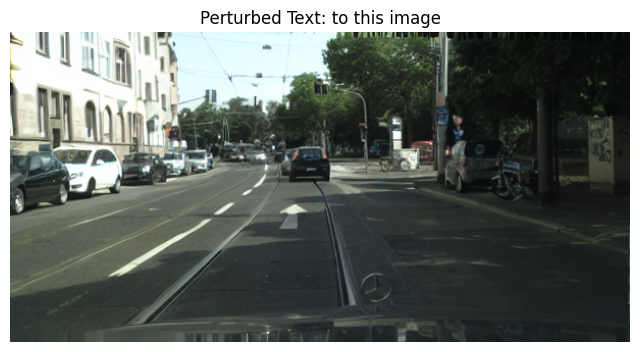

Image generation 5 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 6:
Wasserstein distance (generated vs init): 0.027392766804420418
Wasserstein distance (generated vs orig): 0.00787831043764224


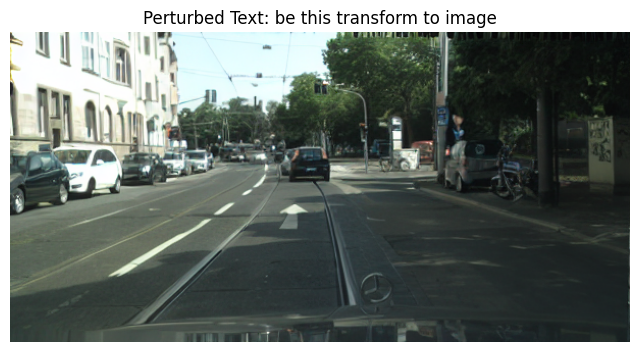

Image generation 6 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 7:
Wasserstein distance (generated vs init): 0.02581697984775627
Wasserstein distance (generated vs orig): 0.007963173241781384


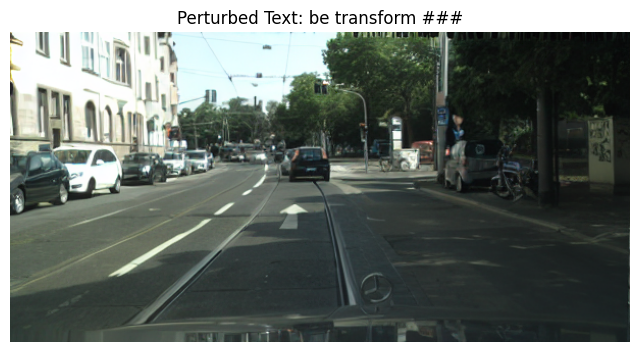

Image generation 7 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 8:
Wasserstein distance (generated vs init): 0.03459654928318894
Wasserstein distance (generated vs orig): 0.01957727446775455


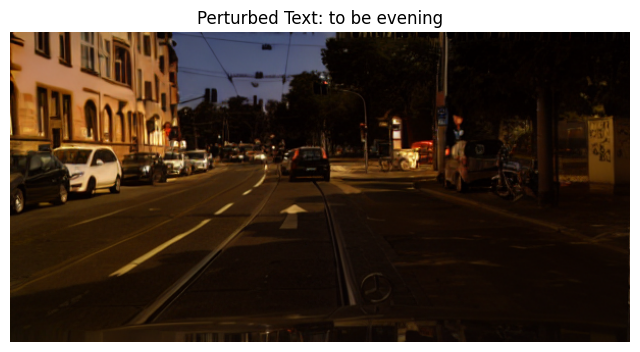

Image generation 8 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 9:
Wasserstein distance (generated vs init): 0.02686130696232189
Wasserstein distance (generated vs orig): 0.00681897353509461


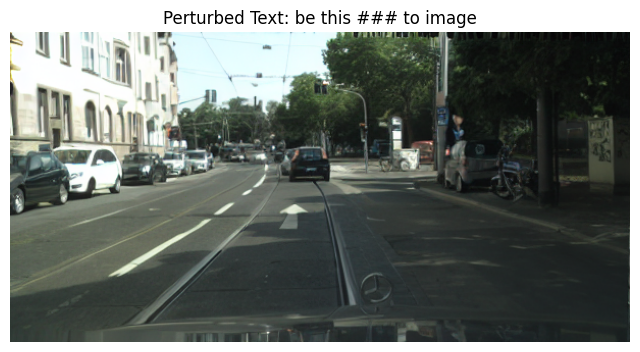

Image generation 9 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 10:
Wasserstein distance (generated vs init): 0.03850895915434195
Wasserstein distance (generated vs orig): 0.03585853897516236


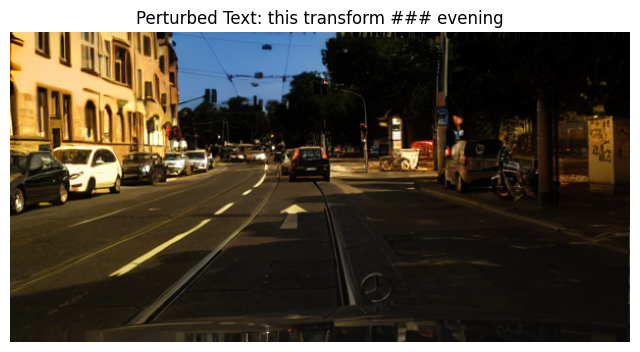

Image generation 10 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 11:
Wasserstein distance (generated vs init): 0.03211568354390693
Wasserstein distance (generated vs orig): 0.016345684525579916


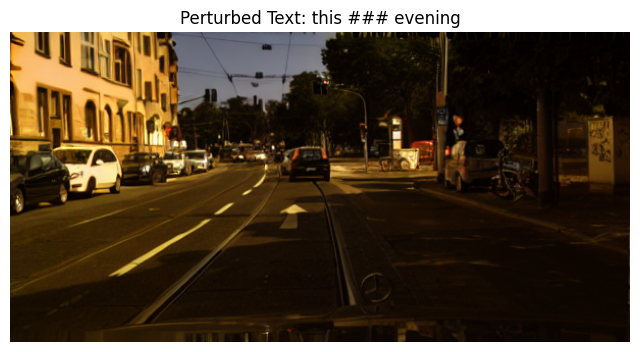

Image generation 11 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 12:
Wasserstein distance (generated vs init): 0.02582295870206509
Wasserstein distance (generated vs orig): 0.006870280794828432


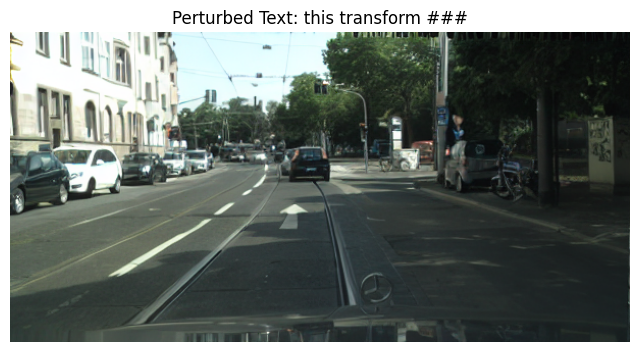

Image generation 12 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 13:
Wasserstein distance (generated vs init): 0.032775241094289725
Wasserstein distance (generated vs orig): 0.03275359020962771


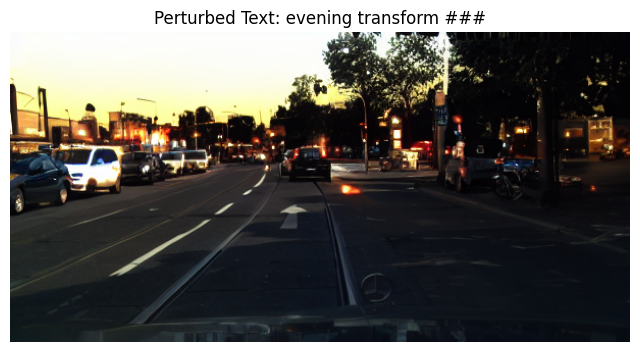

Image generation 13 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 14:
Wasserstein distance (generated vs init): 0.03504918709025638
Wasserstein distance (generated vs orig): 0.021234338860494965


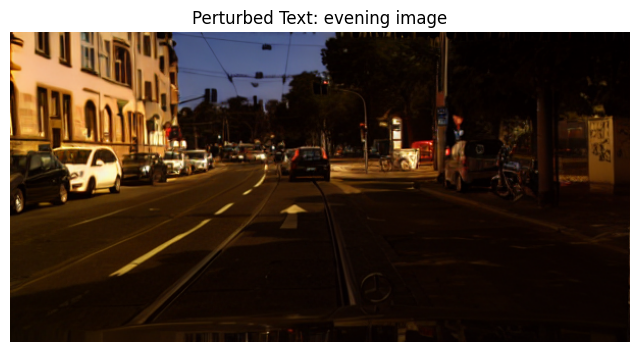

Image generation 14 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 15:
Wasserstein distance (generated vs init): 0.023935908572942338
Wasserstein distance (generated vs orig): 0.01607224518799436


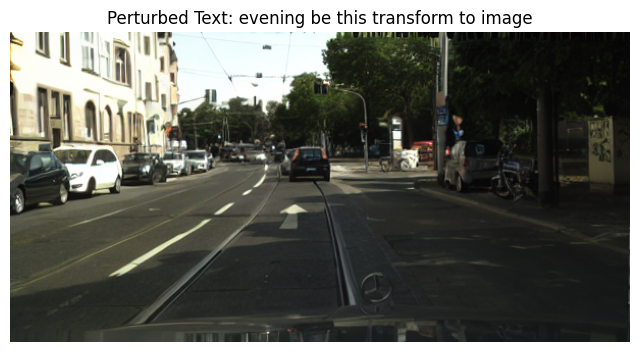

Image generation 15 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 16:
Wasserstein distance (generated vs init): 0.03594547982227899
Wasserstein distance (generated vs orig): 0.02433184321315214


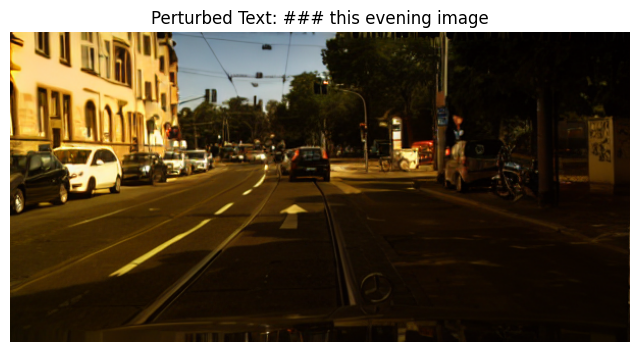

Image generation 16 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 17:
Wasserstein distance (generated vs init): 0.03475970699817785
Wasserstein distance (generated vs orig): 0.01690322240703304


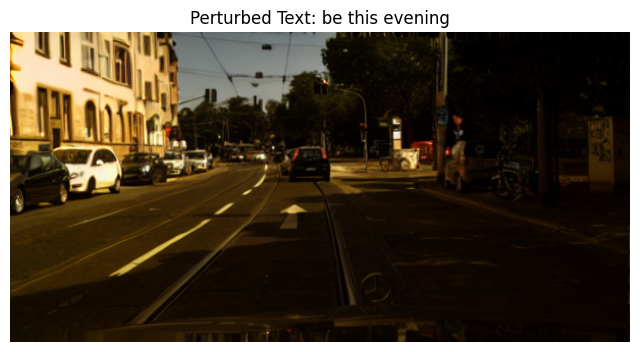

Image generation 17 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 18:
Wasserstein distance (generated vs init): 0.03584022563791223
Wasserstein distance (generated vs orig): 0.02907753760497182


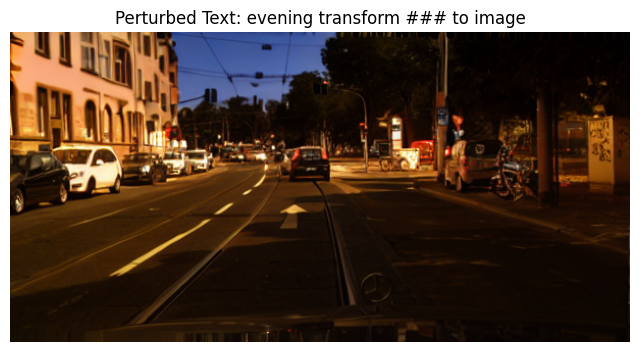

Image generation 18 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 19:
Wasserstein distance (generated vs init): 0.025555507073647735
Wasserstein distance (generated vs orig): 0.008510456359071366


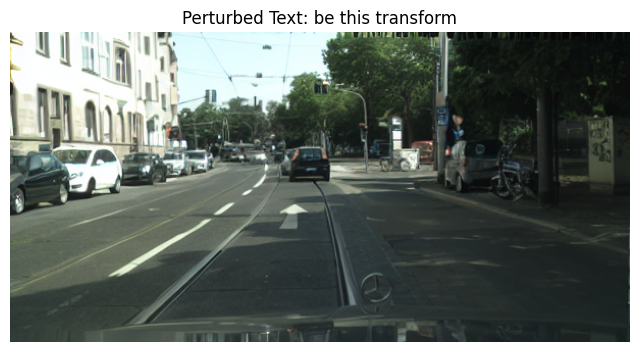

Image generation 19 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 20:
Wasserstein distance (generated vs init): 0.028170140175916472
Wasserstein distance (generated vs orig): 0.007145347659085627


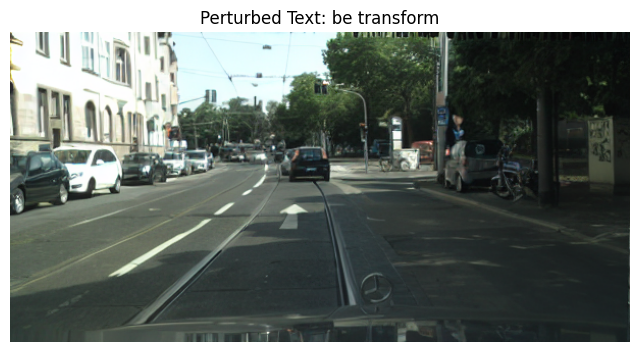

Image generation 20 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 21:
Wasserstein distance (generated vs init): 0.028339462686782724
Wasserstein distance (generated vs orig): 0.008135208931548732


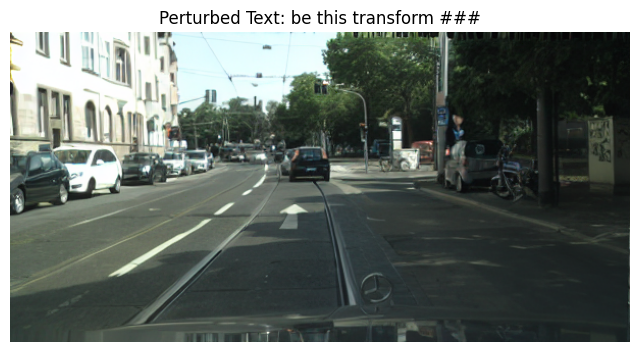

Image generation 21 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 22:
Wasserstein distance (generated vs init): 0.027472277457339572
Wasserstein distance (generated vs orig): 0.007949020579265678


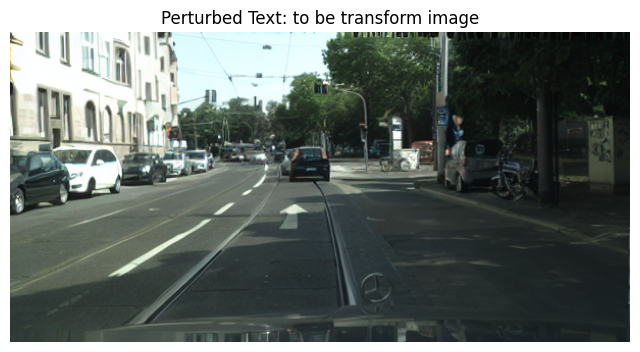

Image generation 22 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 23:
Wasserstein distance (generated vs init): 0.034336974730346505
Wasserstein distance (generated vs orig): 0.017197284479834735


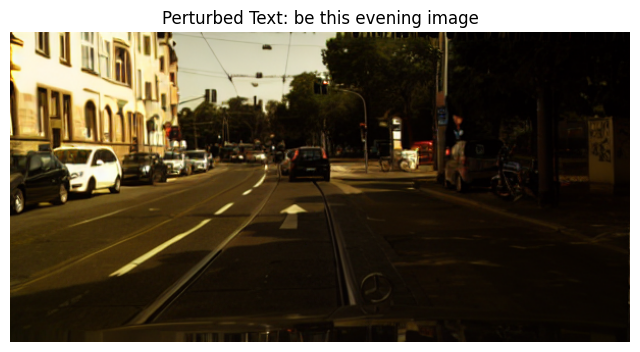

Image generation 23 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 24:
Wasserstein distance (generated vs init): 0.02798480005822058
Wasserstein distance (generated vs orig): 0.007747499591118864


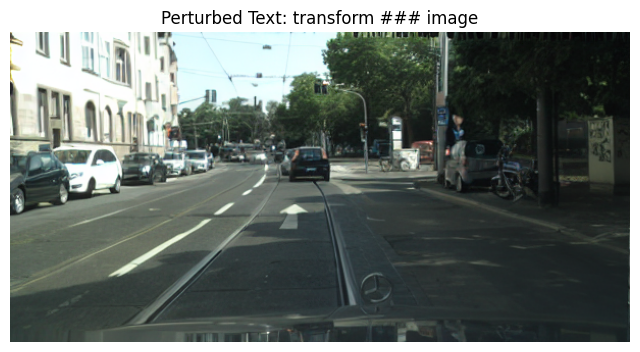

Image generation 24 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 25:
Wasserstein distance (generated vs init): 0.025466745133599037
Wasserstein distance (generated vs orig): 0.020394287073637926


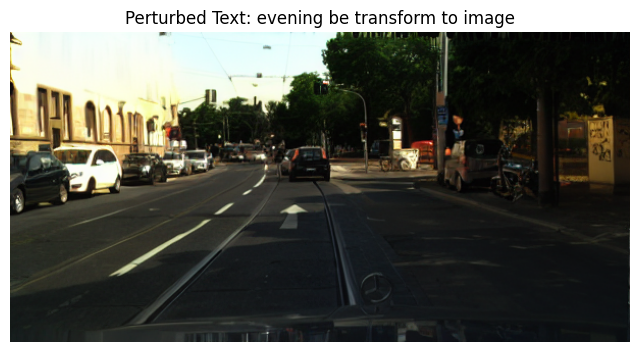

Image generation 25 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 26:
Wasserstein distance (generated vs init): 0.026295349921989945
Wasserstein distance (generated vs orig): 0.0067817555429125305


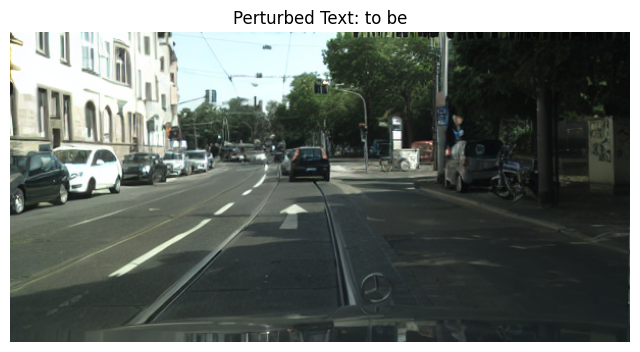

Image generation 26 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 27:
Wasserstein distance (generated vs init): 0.03272207867485123
Wasserstein distance (generated vs orig): 0.02072906068830587


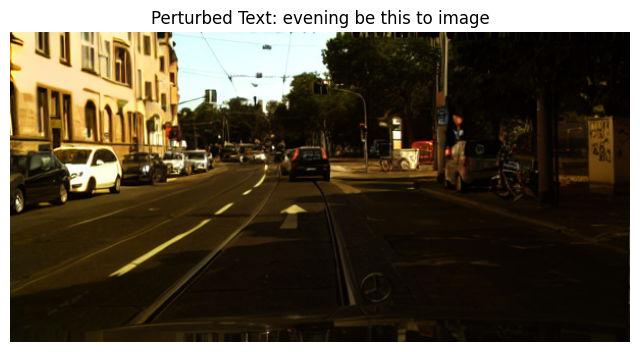

Image generation 27 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 28:
Wasserstein distance (generated vs init): 0.027508015045289852
Wasserstein distance (generated vs orig): 0.00623629283654737


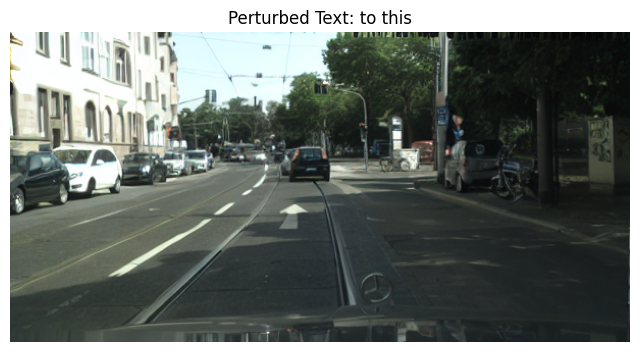

Image generation 28 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 29:
Wasserstein distance (generated vs init): 0.038925823913208056
Wasserstein distance (generated vs orig): 0.03800310360687338


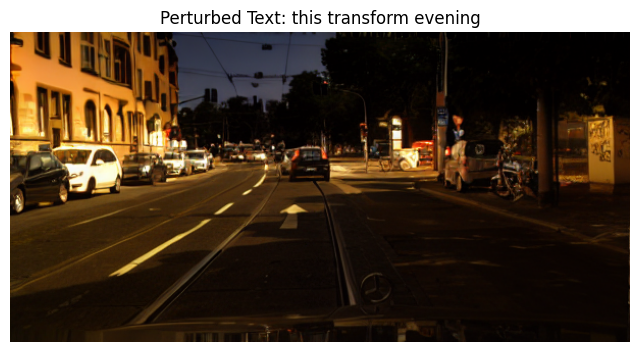

Image generation 29 complete with acceptable Wasserstein distance!


  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

Perturbation 30:
Wasserstein distance (generated vs init): 0.02680867706961485
Wasserstein distance (generated vs orig): 0.007548301683982576


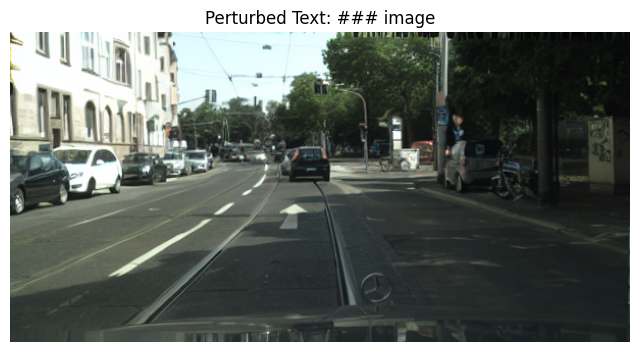

Image generation 30 complete with acceptable Wasserstein distance!
WMD Scores:

Original vs Perturbed 1: 0.6142
Original vs Perturbed 2: 0.2347
Original vs Perturbed 3: 0.2277
Original vs Perturbed 4: 0.2655
Original vs Perturbed 5: 0.5342
Original vs Perturbed 6: 0.2628
Original vs Perturbed 7: 0.3605
Original vs Perturbed 8: 0.4213
Original vs Perturbed 9: 0.2512
Original vs Perturbed 10: 0.1693
Original vs Perturbed 11: 0.3193
Original vs Perturbed 12: 0.5476
Original vs Perturbed 13: 0.2402
Original vs Perturbed 14: 0.5342
Original vs Perturbed 15: 0.1244
Original vs Perturbed 16: 0.2809
Original vs Perturbed 17: 0.4293
Original vs Perturbed 18: 0.1364
Original vs Perturbed 19: 0.3482
Original vs Perturbed 20: 0.3884
Original vs Perturbed 21: 0.2969
Original vs Perturbed 22: 0.2794
Original vs Perturbed 23: 0.3489
Original vs Perturbed 24: 0.2886
Original vs Perturbed 25: 0.2064
Original vs Perturbed 26: 0.6795
Original vs Perturbed 27: 0.2669
Original vs Perturbed 28: 0.6628
Origi

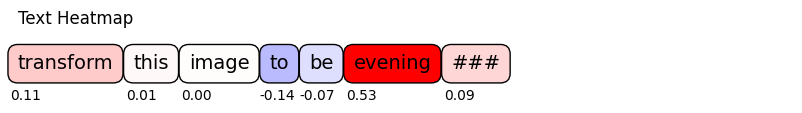


Execution time: 506.19 seconds


In [19]:

# Start time
start_time = time.time()

# Setting up seeds for reproducibility
seed = 1024
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)  # If using GPU
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
generator = torch.Generator().manual_seed(seed)

def perturb_text(text_list, perturbation, rng):
    # Select words based on the perturbation flag (1 means include), ensuring no duplicate words within a single sentence
    perturbed_list_initial = [item for item, flag in zip(text_list, perturbation) if flag == 1 and item.strip() != ""]
    
    # If no words were selected, force-select at least two words
    if len(perturbed_list_initial) < 2:
        additional_words_needed = 2
        available_words = [item for item in text_list if item.strip() != ""]
        additional_words = rng.choice(available_words, additional_words_needed, replace=False)
        perturbed_list = list(set(perturbed_list_initial + list(additional_words)))  # Ensure unique words
    else:
        perturbed_list = list(set(perturbed_list_initial))  # Remove duplicates within the sentence
    
    return perturbed_list

# Assuming `prompt` is predefined
words = prompt.split()
text_list = words.copy()

num_perturb = 30  # Number of perturbations to generate
num_words = len(words)

Responses = []
Perturbations = []
unique_perturbations = set()
rng = np.random.default_rng(seed)

# Try up to a certain number of attempts to generate unique perturbations
attempts = 0
max_attempts = num_perturb * 10  # Allow 10 attempts per unique perturbation

# Loop for unique perturbations only
while len(unique_perturbations) < num_perturb and attempts < max_attempts:
    perturbation = tuple(rng.binomial(1, 0.5, size=num_words))
    if perturbation not in unique_perturbations and sum(perturbation) > 0:
        unique_perturbations.add(perturbation)
        perturbed_txt = perturb_text(text_list, perturbation, rng)
        corpus = ' '.join(perturbed_txt)
        Responses.append(corpus)
        Perturbations.append(perturbation)
        print(f"Perturbation: {perturbation}, Perturbed Text: {corpus}")  # Print unique perturbation text
    attempts += 1

# If more perturbations are needed, allow repeats by sampling from unique_perturbations
while len(Responses) < num_perturb:
    perturbation = rng.choice(list(unique_perturbations))
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    Responses.append(corpus)
    Perturbations.append(perturbation)
    print(f"Perturbation (reused): {perturbation}, Perturbed Text: {corpus}")  # Print reused perturbation text
    epsilon = 1e-6  # A small value to prevent division by zero
WD_dists_generated_vs_orig = []  # List to store Wasserstein distances

for i, perturbation in enumerate(Perturbations):
    # Generate new text for each perturbation
    perturbed_txt = perturb_text(text_list, perturbation, rng)
    corpus = ' '.join(perturbed_txt)
    
    # Set initial Wasserstein distances for generated image
    WD_dist_generated = float('inf')
    WD_dist_generated_vs_orig_value = float('inf')  # Distance between generated_image and orig_image (temporarily stored inside the loop)

    # Repeat generation process
    while WD_dist_generated > 0.07:  
        # Generate the original image (once, if not already generated)
        orig_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text).images[0]

        # Generate another image (generated image)
        generated_image = pipe(
            prompt=corpus,  # Use the perturbed text
            image=init_image, 
            cfg_image=cfg_image, 
            cfg_text=cfg_text).images[0]

        # Extract embeddings for the generated image, original image, and initial image
        generated_embedding = extract_image_embedding(generated_image, processor, model)
        init_embedding = extract_image_embedding(init_image, processor, model)
        orig_embedding = extract_image_embedding(orig_image, processor, model)

        # Calculate Wasserstein distance between generated image and initial image
        WD_dist_generated = wasserstein_distance(generated_embedding, init_embedding)

        # If the distance is greater than 0.1, the image is regenerated and no further calculations are done
        if WD_dist_generated > 0.07:
            print(f"Distance too large (WD_dist_generated = {WD_dist_generated}), regenerating image...")
            continue  # Go back to the beginning of the loop to regenerate the image

        # Calculate Wasserstein distance between generated image and original image
        WD_dist_generated_vs_orig_value = wasserstein_distance(generated_embedding, orig_embedding)

        # Store the Wasserstein distance between the generated image and the original image
        WD_dists_generated_vs_orig.append(WD_dist_generated_vs_orig_value)

        # Display the Wasserstein distances
        print(f"Perturbation {i + 1}:")
        print(f'Wasserstein distance (generated vs init): {WD_dist_generated}')
        print(f'Wasserstein distance (generated vs orig): {WD_dist_generated_vs_orig_value}')

        # Display the image only if the distance is acceptable
        plt.figure(figsize=(8, 8))
        plt.imshow(generated_image)
        plt.title(f"Perturbed Text: {corpus}", fontsize=12)
        plt.axis('off')  # Remove the axes
        plt.show()

        # Save the image to the output path if the distance is acceptable
        print(f"Image generation {i + 1} complete with acceptable Wasserstein distance!")
        break  # Exit the loop if the image is acceptable

wmd_scores = {}
all_texts = [prompt] + Responses  # Include the original text (prompt) and all responses (perturbed texts)

for idx, text in enumerate(Responses):  # Loop through all perturbed texts (Responses)
    wmd_score = model_txt.wmdistance(prompt, text)  # Compute WMD between prompt and perturbed text
    wmd_scores[f"Original vs Perturbed {idx+1}"] = wmd_score

# Display the WMD scores
print("WMD Scores:\n")
for key, value in wmd_scores.items():
    print(f"{key}: {value:.4f}")

# Assigning WMD scores to a variable 'distances' for future use
distances = wmd_scores
Perturbations = np.vstack(Perturbations)
distance_values = np.array(list(distances.values()))
WD_dists_generated_vs_orig = np.array(WD_dists_generated_vs_orig)

# Step 1: Compute the inverse of the distances (add a small value to avoid division by zero)
epsilon = 1e-8  # Small value to prevent division by zero
#inverse_distances = 1 / (WD_dists_generated_vs_orig + epsilon)

# Step 2: Scale the inverse distances between 0 and 1 (Min-Max scaling)
min_inv = np.min(WD_dists_generated_vs_orig)
max_inv = np.max(WD_dists_generated_vs_orig)

Similarities = (WD_dists_generated_vs_orig - min_inv) / (max_inv - min_inv)

# Now Similarities contains the scaled similarities between 0 and 1
print(Similarities)

distance_values = np.array(list(distances.values()))

kernel_width = 0.25

# Compute weights based on the distances
weights = np.sqrt(np.exp(-(distance_values ** 2) / (kernel_width ** 2)))

# Fit a Linear Regression model
linear_model = LinearRegression()

linear_model.fit(X=Perturbations, y= Similarities, sample_weight=weights)

# Retrieve coefficients from the model
coefficients = linear_model.coef_

# Print the coefficients and weights
print("Coefficients from the Linear Regression model:", coefficients)
print("\nComputed Weights:", weights)

def plot_text_heatmap(words, scores, title="", width=10, height=0.4, verbose=0, max_word_per_line=20, word_spacing=20, score_fontsize=10, save_path=None):
    fig = plt.figure(figsize=(width, height))
    ax = plt.gca()
    ax.set_title(title, loc='left')
    cmap = plt.cm.ScalarMappable(cmap=plt.cm.bwr)
    cmap.set_clim(0, 1)
    canvas = ax.figure.canvas
    t = ax.transData
    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5
    loc_y = -0.2
    for i, (token, score) in enumerate(zip(words, scores)):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = '#%02x%02x%02x' % tuple(rgb)
        
        text = ax.text(0.0, loc_y, token, bbox={'facecolor': color, 'pad': 5.0, 'linewidth': 1, 'boxstyle': 'round,pad=0.5'}, transform=t, fontsize=14)
        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()
        score_text = ax.text(0.01, loc_y - 1, f"{score:.2f}", transform=t, fontsize=score_fontsize, ha='center')
        score_text.draw(canvas.get_renderer())
        ex_score = score_text.get_window_extent()
        if (i+1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + word_spacing, units='dots')
    if verbose == 0:
        ax.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight')
    plt.show()
    words = prompt.split(' ')
# Define the save path for Kaggle output
save_path = 'D:\\snowstr\\heatmap.png'


# Call the function with the save_path
plot_text_heatmap(words, coefficients, title="Text Heatmap", save_path=save_path)

# End time
end_time = time.time()
execution_time = end_time - start_time
print(f"\nExecution time: {execution_time:.2f} seconds")
